In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns
from tqdm import tqdm
from rembg import remove

c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


Cell code di atas digunakan untuk mengimpor berbagai library yang diperlukan dalam proses klasifikasi citra berbasis tekstur, mulai dari pemrosesan citra (cv2, matplotlib, numpy), manipulasi data (pandas), pembagian dataset (train\_test\_split), hingga evaluasi model (accuracy\_score, classification\_report, confusion\_matrix, dan metrik lainnya). Selain itu, digunakan pula metode ekstraksi fitur tekstur dengan GLCM (graycomatrix, graycoprops), analisis entropi (entropy), serta algoritma pembelajaran mesin seperti Random Forest, SVM, dan KNN. Visualisasi hasil evaluasi dibantu oleh seaborn dan matplotlib, sedangkan tqdm digunakan untuk menampilkan progres iterasi, dan rembg dimanfaatkan untuk menghapus latar belakang gambar.


In [2]:
data = []
labels = []
file_name = []
for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = plt.imread(img_path)
        
        data.append(img)
        labels.append(sub_folder)
        name = os.path.splitext(filename)[0]
        file_name.append(filename)
        
data = np.array(data)
labels = np.array(labels)


Cell code di atas digunakan untuk membaca seluruh citra dari folder dataset yang terorganisir berdasarkan subfolder label, kemudian menyimpan data citra, label, dan nama file ke dalam list yang dikonversi menjadi array NumPy untuk keperluan pemrosesan lebih lanjut.

In [3]:
# melakukan augmentasi data
data_augmented = []
labels_augmented = []
paths_augmented = []
file_name_augmented = []
for i in range(len(data)):
	pass



Cell code di atas merupakan awal dari proses augmentasi data citra, yang bertujuan untuk memperbanyak variasi data latih guna meningkatkan performa model klasifikasi. Struktur loop disiapkan untuk mengakses setiap citra dalam dataset dan melakukan augmentasi seperti rotasi, flipping, atau translasi, lalu menyimpan hasil augmentasi ke dalam list baru untuk data, label, path, dan nama file. 


In [4]:

print("Data sebelum augmentasi: ", len(data))
print("Data setelah augmentasi: ", len(data_augmented))


Data sebelum augmentasi:  300
Data setelah augmentasi:  0


Cell code di atas digunakan untuk menampilkan jumlah data citra sebelum dan sesudah proses augmentasi, dengan tujuan memberikan gambaran seberapa banyak penambahan data yang dihasilkan dari teknik augmentasi yang diterapkan.

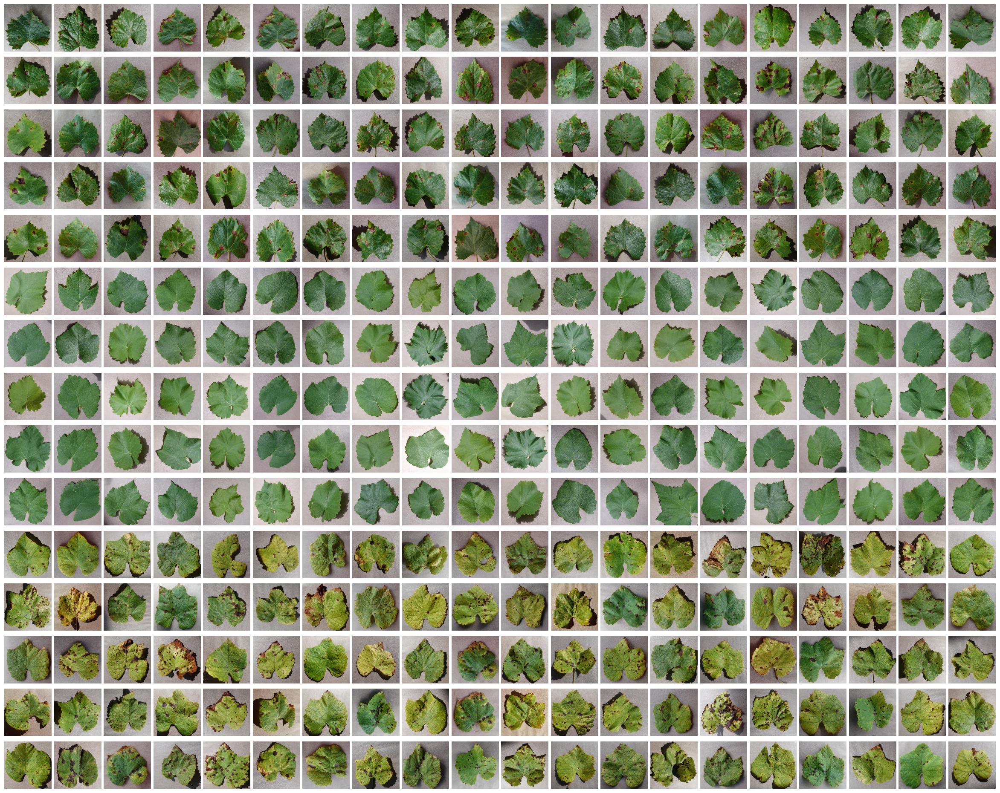

In [5]:

max_display = 400
display_data = data[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx])
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()


Cell code di atas digunakan untuk menampilkan hingga 400 citra pertama dari dataset dalam bentuk grid visual menggunakan `matplotlib`, yang mempermudah dalam memverifikasi isi dataset secara cepat. Citra ditampilkan dalam susunan baris dan kolom (maksimal 20 kolom per baris), dan setiap sumbu dinonaktifkan agar tampilan lebih bersih serta fokus pada visualisasi citra itu sendiri.


## Data Preparation

In [6]:

data_kategori = {}

for img, label, fname in zip(data, labels, file_name):
    if label not in data_kategori:
        data_kategori[label] = []
    data_kategori[label].append((fname, img))  # (filename, image)


Cell code di atas digunakan untuk mengelompokkan data citra ke dalam sebuah struktur `dictionary` berdasarkan kategorinya (label), di mana setiap label berisi daftar pasangan `(nama file, citra)`. Struktur ini memudahkan pengambilan atau analisis citra per kategori di tahap pemrosesan atau visualisasi berikutnya.


### Define Preprocessing Function

In [7]:

def removeBackgroundByCategory(data):
    removed_data = {}
    for kategori, items in data.items():
        removed_list = []
        for filename, img in tqdm(items, desc=f"remove background {kategori}"):
            img_removed = remove(img)
            removed_list.append((filename, img_removed))
        removed_data[kategori] = removed_list
    return removed_data

# 4. Fungsi grayscaling
def gray_scaling(data):
    gray_data = {}
    for kategori, items in data.items():
        gray_list = []
        for filename, img in tqdm(items, desc=f"grayscaling {kategori}"):
            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            gray_list.append((filename, gray))  
        gray_data[kategori] = gray_list
    return gray_data

def resize(img, th, tw):
    h, w = img.shape
    resized = np.zeros((th, tw), dtype=np.uint8)
    skala_y = h / th
    skala_x = w / tw
    for i in range(th):
        for j in range(tw):
            src_y = int(i * skala_y)
            src_x = int(j * skala_x)
            resized[i, j] = img[src_y, src_x]
    return resized

# Normalisasi citra
def normalisasi(img):
    min_val = np.min(img)
    max_val = np.max(img)
    if max_val - min_val == 0:
        return np.zeros_like(img, dtype=np.uint8)
    normalized_img = ((img - min_val) / (max_val - min_val)) * 255
    return normalized_img.astype(np.uint8)

# Padding khusus Roberts
def padding_baris(img):
    h, w = img.shape
    img_pad = np.zeros((h, w + 1))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

def padding_kolom(img):
    h, w = img.shape
    img_pad = np.zeros((h + 1, w))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

# Konvolusi khusus edge
def konvo_edge(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    if jenis != "roberts":
        padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    else:
        padded_img = padding_kolom(padding_baris(img))
    result = np.zeros([img_h, img_w])
    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(padded_img[i:i+kernel_h, j:j+kernel_w] * kernel)
    return result

# Edge detection
def edge(image, kernelX, kernelY, jenis):
    gradX = konvo_edge(image, kernelX, jenis)
    gradY = konvo_edge(image, kernelY, jenis)
    M = np.sqrt((gradX * gradX) + (gradY * gradY))
    return M.astype(np.uint8)

# Kernel morfologi dan filter
kernel3x3_empty = np.ones((3, 3), dtype=np.uint8)

Px = np.array([[-1,0,1],
               [-1,0,1],
               [-1,0,1]])

Py = np.array([[1,1,1],
               [0,0,0],
               [-1,-1,-1]])


<h3>Processing<h3>

In [8]:
# 5. Jalankan proses
removej = removeBackgroundByCategory(data_kategori)
grayj = gray_scaling(removej)


remove background Grape___healthy: 100%|██████████| 100/100 [04:29<00:00,  2.70s/it]
remove background Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [04:31<00:00,  2.71s/it]
grayscaling Grape___healthy: 100%|██████████| 100/100 [00:00<00:00, 2084.92it/s]
grayscaling Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [00:00<00:00, 3562.04it/s]


Cell di atas menjalankan proses praproses citra secara berurutan dengan pertama menghapus latar belakang setiap citra pada `data_kategori` menggunakan fungsi `removeBackgroundByCategory`, kemudian mengubah hasilnya menjadi citra grayscale dengan fungsi `gray_scaling`, sehingga menghasilkan data siap pakai untuk tahap analisis berikutnya.


Kategori: Grape___Black_rot


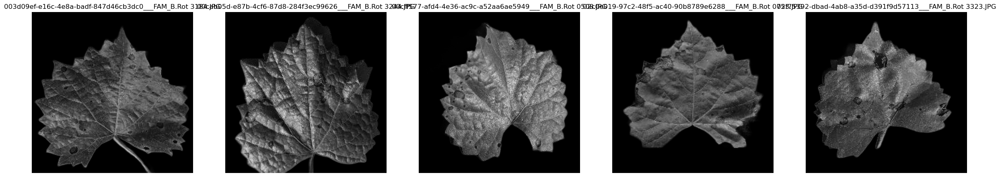

Kategori: Grape___healthy


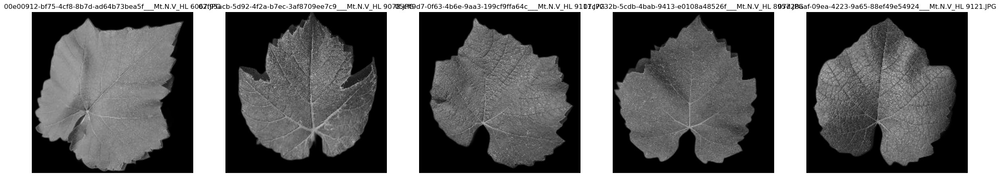

Kategori: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)


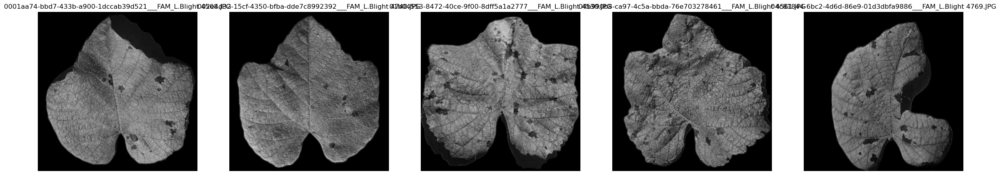

In [9]:

n_display = 5

for kategori, items in grayj.items():
    print(f"Kategori: {kategori}")
    plt.figure(figsize=(30, 15))
    
    for i, (filename, img) in enumerate(items[:n_display]):
        plt.subplot(1, n_display, i+1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGRA2RGBA))
        plt.title(filename)
        plt.axis('off')
    
    plt.show()

Cell di atas digunakan untuk menampilkan contoh hasil citra grayscale setelah proses penghapusan latar belakang, dengan menampilkan hingga 5 gambar per kategori lengkap dengan nama file, menggunakan subplot agar visualisasi tiap kategori terlihat rapi dan mudah dibandingkan.


In [10]:

data = []

for items in grayj.values():
    for _, img in items:
        data.append(img)

Cell di atas berfungsi untuk mengumpulkan semua citra hasil grayscale dari setiap kategori ke dalam satu list `data` agar dapat digunakan untuk proses selanjutnya secara keseluruhan tanpa memandang kategori.


In [11]:
dataPreprocessed = []
for i in range(len(data)): # Loop through each image and do preprocessing
	img = data[i]
	img = resize(img, 128, 128)
	img = normalisasi(img)
	img = edge(img, Px, Py, "prewitt")


	dataPreprocessed.append(img)

	

Cell di atas digunakan untuk melakukan preprocessing sederhana dengan cara mengiterasi setiap citra dalam list `data` dan menambahkan citra tersebut ke dalam list baru `dataPreprocessed` sebagai persiapan tahap pengolahan berikutnya.


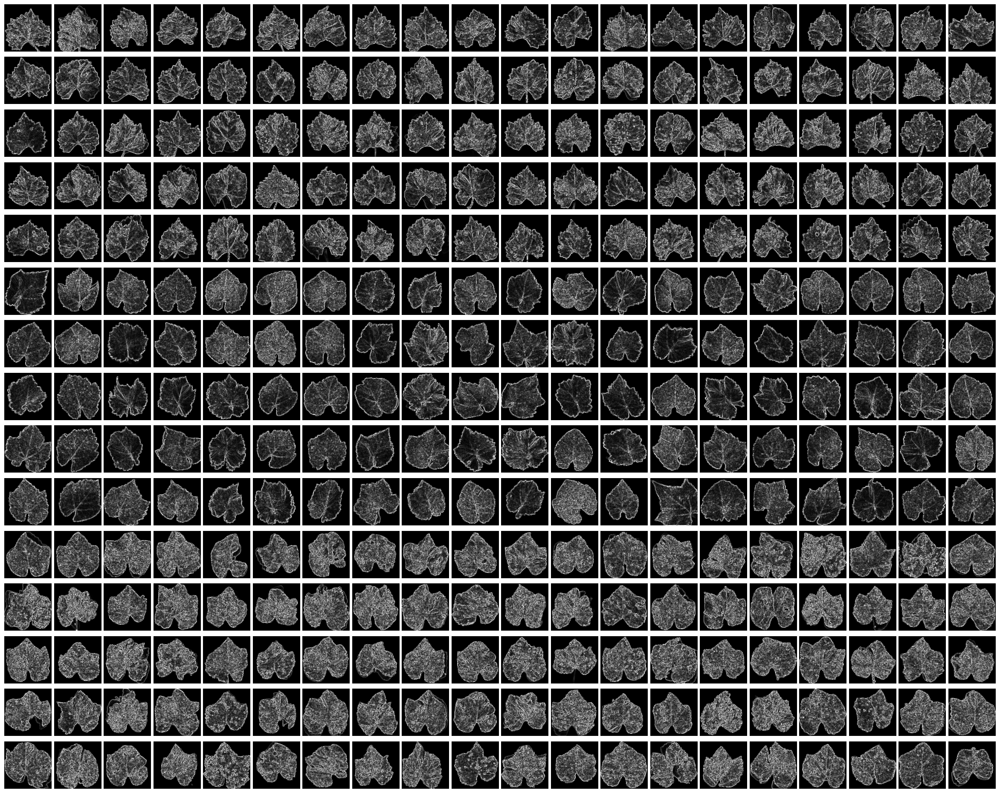

In [12]:

max_display = 400
display_data = dataPreprocessed[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx], cmap='gray')
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

Cell di atas digunakan untuk menampilkan hingga 300 citra hasil preprocessing secara grid dengan 20 kolom, dimana setiap citra ditampilkan dalam skala abu-abu (grayscale) untuk memudahkan visualisasi data sebelum tahap pengolahan lanjutan.


In [13]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    # mengembalikan matrix glcm dari image
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    return glcm


Cell di atas fungsi `glcm` di atas digunakan untuk menghasilkan matriks GLCM (Gray-Level Co-occurrence Matrix) dari sebuah citra grayscale dengan arah (derajat) tertentu yang bisa dipilih di antara 0, 45, 90, dan 135 derajat; fungsi ini memanfaatkan `graycomatrix` dari skimage untuk menghitung matriks dengan jarak piksel 1, normalisasi, dan simetri.


In [14]:

def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]


Cell di atas fungsi `correlation` ini digunakan untuk menghitung fitur korelasi dari matriks GLCM yang diberikan, dengan memanfaatkan fungsi `graycoprops` dari pustaka skimage, lalu mengembalikan nilai korelasi pada posisi \[0,0] sebagai hasilnya.


In [15]:

def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]


Cell di atas berisi fungsi `dissimilarity` yang digunakan untuk menghitung nilai ketidaksamaan (dissimilarity) dari matriks GLCM yang diberikan dengan memanfaatkan fungsi `graycoprops` dari pustaka skimage, kemudian mengembalikan nilai tersebut dari posisi indeks \[0, 0].


In [16]:

def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]


Cell di atas berisi fungsi `homogenity` yang berfungsi untuk menghitung nilai homogenitas dari matriks GLCM yang diberikan menggunakan fungsi `graycoprops` dari skimage, kemudian mengembalikan hasilnya pada indeks \[0, 0].


In [17]:

def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]


Cell di atas berisi fungsi `contrast` yang berfungsi untuk menghitung nilai kontras dari matriks GLCM yang diberikan dengan menggunakan fungsi `graycoprops` dari skimage, lalu mengembalikan hasilnya pada indeks \[0, 0].


In [18]:

def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]


Cell di atas berisi fungsi `ASM` yang berfungsi untuk menghitung nilai Angular Second Moment (ASM) atau energy dari matriks GLCM menggunakan `graycoprops` dari skimage, kemudian mengembalikan hasilnya pada indeks \[0, 0].


In [19]:
def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

Cell di atas berisi fungsi `energy` yang berfungsi untuk menghitung nilai energy dari matriks GLCM menggunakan fungsi `graycoprops` dari skimage, kemudian mengembalikan hasilnya pada indeks \[0, 0].


In [20]:
def entropyGlcm(matriks):
    return entropy(matriks.ravel())


Cell di atas berisi fungsi `entropyGlcm` yang berfungsi untuk menghitung nilai entropi dari matriks GLCM yang diberikan. Fungsi ini menggunakan `entropy` dari scipy dengan input berupa matriks GLCM yang diubah menjadi vektor satu dimensi melalui `ravel()`, lalu mengembalikan nilai entropi tersebut.


In [21]:
Derajat0 = []
Derajat45 = []
Derajat90 = []
Derajat135 = []
for i in range(len(dataPreprocessed)):
    D0 = glcm(dataPreprocessed[i], 0)
    D45 = glcm(dataPreprocessed[i], 45)
    D90 = glcm(dataPreprocessed[i], 90)
    D135 = glcm(dataPreprocessed[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)


Cell di atas digunakan untuk menghitung matriks GLCM dari setiap citra pada data `dataPreprocessed` pada empat arah derajat (0°, 45°, 90°, dan 135°). Hasil matriks GLCM tersebut kemudian disimpan masing-masing ke dalam list `Derajat0`, `Derajat45`, `Derajat90`, dan `Derajat135` untuk diproses lebih lanjut.


In [22]:

Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 =  [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 =  [], [], [], []
ASM0, ASM45, ASM90, ASM135 =  [], [], [], []
energy0, energy45, energy90, energy135 =  [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []


Cell di atas digunakan untuk membuat daftar kosong yang akan menampung nilai fitur tekstur hasil ekstraksi dari matriks GLCM pada masing-masing derajat (0°, 45°, 90°, dan 135°), yaitu fitur kontras, dissimilarity, homogenity, entropy, ASM, energy, dan korelasi, untuk setiap citra dalam dataset.


In [23]:


for i in range(len(dataPreprocessed)):
    C0 = correlation(Derajat0[i])
    correlation0.append(C0)
    C45 = correlation(Derajat45[i])
    correlation45.append(C45)
    C90 = correlation(Derajat90[i])
    correlation90.append(C90)
    C135 = correlation(Derajat135[i])
    correlation135.append(C135)


Cell di atas berfungsi untuk menghitung nilai fitur korelasi dari matriks GLCM pada empat arah (0°, 45°, 90°, dan 135°) untuk setiap citra yang sudah dipreproses, lalu menyimpan hasilnya ke dalam list terpisah sesuai dengan arah masing-masing.


In [24]:

for i in range(len(dataPreprocessed)):
    K0 = contrast(Derajat0[i])
    K45 = contrast(Derajat45[i])
    K90 = contrast(Derajat90[i])
    K135 = contrast(Derajat135[i])
    Kontras0.append(K0)
    Kontras45.append(K45)
    Kontras90.append(K90)
    Kontras135.append(K135)


Cell di atas berfungsi untuk menghitung nilai fitur kontras dari matriks GLCM pada empat arah (0°, 45°, 90°, dan 135°) untuk setiap citra hasil preprocessing, kemudian menyimpan hasil kontras tersebut ke dalam list yang terpisah berdasarkan arah masing-masing.


In [25]:

for i in range(len(dataPreprocessed)):
    Dis0 = dissimilarity(Derajat0[i])
    Dis45 = dissimilarity(Derajat45[i])
    Dis90 = dissimilarity(Derajat90[i])
    Dis135 = dissimilarity(Derajat135[i])
    dissimilarity0.append(Dis0)
    dissimilarity45.append(Dis45)
    dissimilarity90.append(Dis90)
    dissimilarity135.append(Dis135)


Cell di atas berfungsi untuk menghitung nilai fitur dissimilarity dari matriks GLCM pada empat arah (0°, 45°, 90°, dan 135°) untuk setiap citra hasil preprocessing, kemudian menyimpan nilai dissimilarity tersebut ke dalam list yang terpisah sesuai arah masing-masing.


In [26]:

for i in range(len(dataPreprocessed)):
    H0 = homogenity(Derajat0[i])
    H45 = homogenity(Derajat45[i])
    H90 = homogenity(Derajat90[i])
    H135 = homogenity(Derajat135[i])
    homogenity0.append(H0)
    homogenity45.append(H45)
    homogenity90.append(H90)
    homogenity135.append(H135)


Cell di atas berfungsi untuk menghitung nilai fitur homogenity dari matriks GLCM pada empat arah (0°, 45°, 90°, dan 135°) untuk setiap citra hasil preprocessing, kemudian menyimpan nilai homogenity tersebut ke dalam list yang terpisah sesuai arah masing-masing.


In [27]:

for i in range(len(dataPreprocessed)):  
    E0 = entropyGlcm(Derajat0[i])
    E45 = entropyGlcm(Derajat45[i])
    E90 = entropyGlcm(Derajat90[i])
    E135 = entropyGlcm(Derajat135[i])
    entropy0.append(E0)
    entropy45.append(E45)
    entropy90.append(E90)
    entropy135.append(E135)


Cell di atas berfungsi untuk menghitung nilai entropi dari matriks GLCM pada empat arah (0°, 45°, 90°, dan 135°) untuk setiap citra hasil preprocessing, kemudian menyimpan nilai entropi tersebut ke dalam list yang terpisah sesuai arah masing-masing.


In [28]:

for i in range(len(dataPreprocessed)):
    A0 = ASM(Derajat0[i])
    A45 = ASM(Derajat45[i])
    A90 = ASM(Derajat90[i])
    A135 = ASM(Derajat135[i])
    ASM0.append(A0)
    ASM45.append(A45)
    ASM90.append(A90)
    ASM135.append(A135)


Cell di atas berfungsi untuk menghitung nilai Angular Second Moment (ASM) dari matriks GLCM pada empat arah (0°, 45°, 90°, dan 135°) untuk setiap citra hasil preprocessing, kemudian menyimpan nilai ASM tersebut ke dalam list yang terpisah sesuai arah masing-masing.


In [29]:

for i in range(len(dataPreprocessed)):
    ER0 = energy(Derajat0[i])
    ER45 = energy(Derajat45[i])
    ER90 = energy(Derajat90[i])
    ER135 = energy(Derajat135[i])
    energy0.append(ER0)
    energy45.append(ER45)
    energy90.append(ER90)
    energy135.append(ER135)


Cell di atas berfungsi untuk menghitung nilai energy dari matriks GLCM pada empat sudut (0°, 45°, 90°, dan 135°) untuk setiap citra yang telah diproses, lalu menyimpan hasil perhitungan energy tersebut ke dalam list yang terpisah berdasarkan sudutnya.


In [30]:

print("Filename:", len(file_name))
print("Label:", len(labels))
print("Kontras0:", len(Kontras0))
print("Kontras45:", len(Kontras45))
print("Kontras90:", len(Kontras90))
print("Kontras135:", len(Kontras135))
print("Homogeneity0:", len(homogenity0))
print("Homogeneity45:", len(homogenity45))
print("Homogeneity90:", len(homogenity90))
print("Homogeneity135:", len(homogenity135))
print("Entropy0:", len(entropy0))
print("Entropy45:", len(entropy45))
print("Entropy90:", len(entropy90))
print("Entropy135:", len(entropy135))
print("Correlation0:", len(correlation0))
print("Correlation45:", len(correlation45))
print("Correlation90:", len(correlation90))
print("Correlation135:", len(correlation135))

Filename: 300
Label: 300
Kontras0: 300
Kontras45: 300
Kontras90: 300
Kontras135: 300
Homogeneity0: 300
Homogeneity45: 300
Homogeneity90: 300
Homogeneity135: 300
Entropy0: 300
Entropy45: 300
Entropy90: 300
Entropy135: 300
Correlation0: 300
Correlation45: 300
Correlation90: 300
Correlation135: 300


Cell di atas digunakan untuk menampilkan jumlah data dari berbagai variabel fitur dan metadata yang telah dihitung dan diproses, seperti jumlah file, label, serta panjang list fitur GLCM pada berbagai sudut (kontras, homogenitas, entropi, korelasi), untuk memastikan bahwa jumlah data pada setiap variabel konsisten dan sesuai dengan jumlah citra yang diproses.


In [31]:
dataTable = {'Filename': file_name, 'Label': labels,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
        }
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_3.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_3.csv')
hasilEkstrak

,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,003d09ef-e16c-4e8a-badf-847d46cb3dc0___FAM_B.R...,Grape___Black_rot,2576.623339,3225.637795,2964.110421,3479.860996,0.413412,0.403203,0.412811,0.399318,...,0.153136,0.145461,0.390592,0.383005,0.391325,0.381393,0.676858,0.596340,0.628175,0.564526
1,00cab05d-e87b-4cf6-87d8-284f3ec99626___FAM_B.R...,Grape___Black_rot,3291.802904,3641.327485,3130.099225,3904.485275,0.350501,0.339802,0.354307,0.338566,...,0.107656,0.101280,0.325716,0.317943,0.328110,0.318245,0.635816,0.597557,0.653649,0.568473
2,00cff577-afd4-4e36-ac9c-a52aa6ae5949___FAM_B.R...,Grape___Black_rot,2361.743233,2826.741521,2246.874508,2990.274785,0.479068,0.466452,0.481190,0.464752,...,0.194285,0.184738,0.439674,0.430695,0.440778,0.429811,0.687381,0.627079,0.702585,0.605504
3,02c0e019-97c2-48f5-ac40-90b8789e6288___FAM_B.R...,Grape___Black_rot,1743.038509,2377.486515,2248.429995,2484.765206,0.522207,0.510198,0.521130,0.510132,...,0.252389,0.244775,0.501956,0.494812,0.502383,0.494748,0.742225,0.649773,0.667483,0.633969
4,02f75392-dbad-4ab8-a35d-d391f9d57113___FAM_B.R...,Grape___Black_rot,1815.551058,2417.522847,1941.843504,2318.790750,0.533816,0.520651,0.531447,0.522488,...,0.261878,0.253890,0.511432,0.504118,0.511740,0.503875,0.720367,0.629237,0.700915,0.644379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,4cd25f42-7cda-4507-a1bd-a03b5f439ef5___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),3682.813853,4068.606919,3369.422060,4131.379689,0.298640,0.288057,0.304792,0.289720,...,0.077864,0.072185,0.275109,0.268044,0.279042,0.268673,0.568187,0.523492,0.605356,0.516140
296,4d7ad495-1420-4ac7-9123-f0aa1e828270___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),3200.517224,3513.287061,2795.415662,3691.058156,0.382821,0.372366,0.384309,0.373055,...,0.133884,0.127276,0.364671,0.356759,0.365902,0.356757,0.607388,0.569698,0.657083,0.547925
297,4d8aa281-ddb5-4f46-a95c-72a65c59903a___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),2514.818467,2944.326927,2461.231914,3016.155682,0.420903,0.410970,0.420022,0.409489,...,0.160040,0.154232,0.400784,0.392603,0.400050,0.392724,0.659698,0.602531,0.667102,0.592835
298,4e32244f-8e20-4788-8c49-93e971113104___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),2421.449803,3050.697563,2425.418123,2958.180978,0.294091,0.283193,0.295753,0.283438,...,0.072640,0.068401,0.269586,0.261228,0.269519,0.261537,0.594874,0.489482,0.593931,0.504964


Cell di atas berfungsi untuk menyusun data fitur hasil ekstraksi dari citra menjadi sebuah dictionary yang kemudian diubah menjadi DataFrame menggunakan pandas. DataFrame ini berisi kolom-kolom seperti nama file, label, dan berbagai fitur GLCM (kontras, homogenitas, dissimilarity, entropi, ASM, energi, korelasi) pada sudut 0, 45, 90, dan 135 derajat. Setelah itu, DataFrame disimpan dalam format CSV dengan nama `hasil_ekstraksi_3.csv`, dan kemudian file CSV tersebut dibaca kembali untuk ditampilkan hasilnya.


<Axes: >

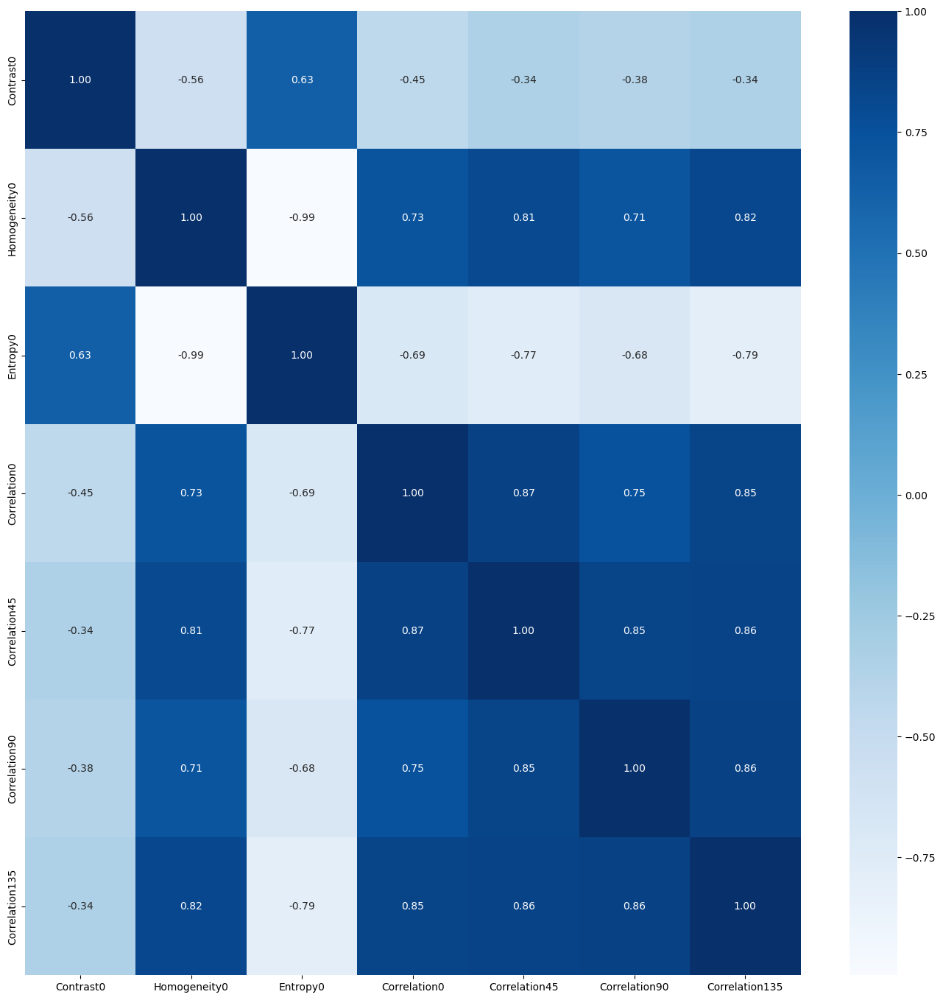

In [32]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")


Cell di atas berfungsi untuk menghitung korelasi antar fitur numerik dalam dataset hasil ekstraksi, kemudian melakukan seleksi fitur dengan menghilangkan fitur yang memiliki korelasi absolut lebih dari threshold (0.95) agar fitur yang sangat mirip tidak redundan. Setelah fitur terpilih dipilih, data fitur baru (`x_new`) dan label (`y`) dipisahkan. Selanjutnya, dilakukan visualisasi korelasi antar fitur terpilih menggunakan heatmap dengan library seaborn untuk memudahkan analisis hubungan antar fitur.


In [33]:

# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)


(240, 7)
(60, 7)


Cell di atas berfungsi untuk membagi dataset fitur (`x_new`) dan label (`y`) menjadi data latih dan data uji dengan proporsi 80% untuk pelatihan dan 20% untuk pengujian menggunakan fungsi `train_test_split` dari scikit-learn. Parameter `random_state=42` digunakan agar pembagian data bisa direproduksi. Kemudian, ukuran data latih dan data uji dicetak untuk memastikan pembagian sudah sesuai.


In [34]:

X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=5, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)


Cell di atas melakukan normalisasi fitur data latih dan data uji dengan cara mengurangi rata-rata dan membagi dengan standar deviasi dari data latih agar data memiliki distribusi standar (standarisasi). Fungsi `generateClassificationReport` dibuat untuk menampilkan laporan klasifikasi lengkap yang mencakup metrik precision, recall, f1-score, confusion matrix, dan akurasi. Selain itu, beberapa model klasifikasi didefinisikan yaitu Random Forest dengan 5 estimator, Support Vector Machine (SVM) dengan kernel RBF, dan K-Nearest Neighbors (KNN) dengan 5 tetangga. Semua model disiapkan dengan `random_state=42` agar hasil eksperimen dapat direproduksi.


In [35]:

rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.97      0.97      0.97        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.99      0.99      0.99        78
                           Grape___healthy       0.98      0.98      0.98        84

                                  accuracy                           0.98       240
                                 macro avg       0.98      0.98      0.98       240
                              weighted avg       0.98      0.98      0.98       240

[[76  1  1]
 [ 0 77  1]
 [ 2  0 82]]
Accuracy: 0.9791666666666666

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.85      0.77      0.81        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.77      0.77      0.77        22
                           Grape___healt

Cell di atas digunakan untuk melatih model Random Forest dengan data latih (`X_train`, `y_train`), kemudian membuat prediksi pada data latih dan data uji. Setelah itu, hasil prediksi dievaluasi menggunakan fungsi `generateClassificationReport` untuk menampilkan laporan performa model, termasuk metrik seperti precision, recall, f1-score, confusion matrix, dan akurasi pada kedua dataset tersebut.


In [36]:

svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.87      0.85      0.86        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.88      0.91      0.89        78
                           Grape___healthy       0.90      0.89      0.90        84

                                  accuracy                           0.88       240
                                 macro avg       0.88      0.88      0.88       240
                              weighted avg       0.88      0.88      0.88       240

[[66  7  5]
 [ 4 71  3]
 [ 6  3 75]]
Accuracy: 0.8833333333333333

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.79      0.86      0.83        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.91      0.91      0.91        22
                           Grape___heal

Cell di atas berfungsi untuk melatih model SVM (Support Vector Machine) dengan kernel RBF menggunakan data latih (`X_train`, `y_train`), kemudian melakukan prediksi pada data latih dan data uji. Selanjutnya, performa model dievaluasi dengan memanggil fungsi `generateClassificationReport` yang menampilkan metrik evaluasi seperti precision, recall, f1-score, confusion matrix, dan akurasi untuk kedua set data tersebut.


In [37]:

knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------


                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.84      0.86      0.85        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.86      0.90      0.88        78
                           Grape___healthy       0.92      0.87      0.90        84

                                  accuracy                           0.88       240
                                 macro avg       0.88      0.88      0.87       240
                              weighted avg       0.88      0.88      0.88       240

[[67  6  5]
 [ 7 70  1]
 [ 6  5 73]]
Accuracy: 0.875

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.79      0.86      0.83        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.90      0.86      0.88        22
                           Grape___healthy       0.80      0.75      0.77     

Cell di atas digunakan untuk melatih model KNN (K-Nearest Neighbors) dengan data latih (`X_train`, `y_train`), lalu melakukan prediksi pada data latih dan data uji. Setelah itu, model dievaluasi dengan memanggil fungsi `generateClassificationReport` yang akan menampilkan metrik performa seperti precision, recall, f1-score, confusion matrix, dan akurasi untuk kedua set data tersebut.


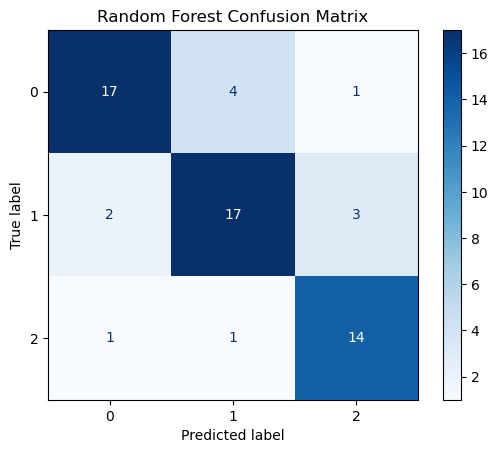

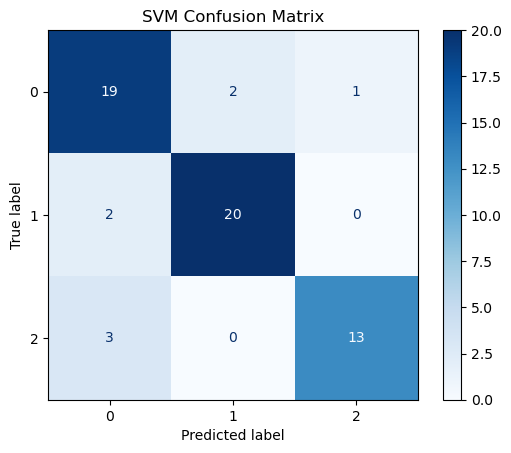

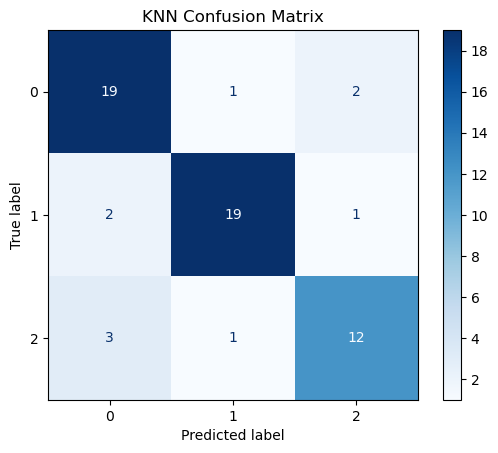

In [38]:


def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")

Cell di atas berfungsi untuk menampilkan confusion matrix dari hasil prediksi model Random Forest, SVM, dan KNN pada data uji (`X_test`). Fungsi `plot_confusion_matrix` menerima label asli dan prediksi, lalu membuat visualisasi confusion matrix dengan colormap biru untuk memudahkan analisis performa tiap kelas secara visual. 